# NETFLIX
---
0. NETFILX 소개
    - ....
1. 데이터 수집
    - Netflix_Data
    - Netflix_Original Data
    - Rating_Data
    - Netflix_Data + Netflix_Original Data + Rating_Data
2. 데이터 전처리
    - 결측치 수정 및 제거
    - Feature engineering
3. 데이터 EDA
    - Score, avg, total 먼저 비교 !! 
    
4. 결론

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings 
import folium

print(folium.__version__)
plt.style.use('ggplot')
%config InlineBackend.figure_format = 'retina'
warnings.filterwarnings(action='ignore')


0.12.1.post1


## 0. NETFILX 소개

## 1. 데이터 수집
---


### Netflix_Data
</br>

__✅COLUMNS__
</br>

| SHOW_ID | 영화나 티비쇼의 고유번호  |
| --- | --- |
| TYPE | 영화인지 티비쇼인지 구별 |
| TITLE | 영화, 티비쇼의 제목 |
| DIRECTOR | 영화감독 |
| CAST | 영화, 쇼에 출연한 배우들 |
| COUNTRY | 영화나 쇼가 제작된 나라 |
| DATE_ADDED | 넷플릭스에 드라마나 영화가 방영된 날짜. 2008.01 ~ 2021.09.25 |
| RELEASE_YEAR | 실제 드라마나 영화가 방영된 연도. 1925 ~ 2021 |
| RATING | 영화/쇼의 시청 등급 |
| DURATION | 방영기간 |
| LISTED_IN | 장르 |
| DESCRIPTION | 줄거리 |



In [2]:
path = '../data'
Net_df = pd.read_csv(path+"/fixed_netflix_df.csv")
Net_df.head()

,show_id,type,director,title,cast,country,date_added,description,duration,listed_in,rating,release_year
0,s1,Movie,Kirsten Johnson,Dick Johnson Is Dead,"Michael Hilow, Dick Johnson, Chad Knorr, Vasth...",United States,"September 25, 2021","As her father nears the end of his life, filmm...",90 min,Documentaries,PG-13,2020
1,s2,TV Show,Nosipho Dumisa,Blood & Water,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021","After crossing paths at a party, a Cape Town t...",2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",TV-MA,2021
2,s3,TV Show,Julien Leclercq,Ganglands,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",France,"September 24, 2021",To protect his family from a powerful drug lor...,1 Season,"Crime TV Shows, International TV Shows, TV Act...",TV-MA,2021
3,s4,TV Show,Jacquelyn C. Migdal,Jailbirds New Orleans,NONE,United States,"September 24, 2021","Feuds, flirtations and toilet talk go down amo...",1 Season,"Docuseries, Reality TV",TV-MA,2021
4,s5,TV Show,Raghav Subbu,Kota Factory,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",In a city of coaching centers known to train I...,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",TV-MA,2021


### Netflix_Original Data
__✅ COLUMNS__

In [3]:
OG = pd.read_csv("../data/NetflixOriginals.csv", encoding="ISO-8859-1")
OG = OG["Title"].tolist()
OG[:10]

['Enter the Anime',
 'Dark Forces',
 'The App',
 'The Open House',
 'Kaali Khuhi',
 'Drive',
 'Leyla Everlasting',
 'The Last Days of American Crime',
 'Paradox',
 'Sardar Ka Grandson']

### Rating_Data
__✅ COLUMNS__

In [4]:
Rating_df = pd.read_csv("../data/Netflix_Rating.csv")
Rating_df.head()

,Title,Avg,Total,Total_males,Total_Females,All_below_18,All_18_29,All_30_44,All_over_45,Males_below_18,...,Males_rank_below_18,Males_rank_18_29,Males_rank_30_44,Males_rank_over_45,Females_rank_below_18,Females_rank_18_29,Females_rank_30_44,Females_rank_over_45,Avg_rank_males,Avg_rank_Females
0,Dick Johnson Is Dead,7.4,6241.0,3780.0,592.0,12.0,1050.0,2321.0,817.0,10.0,...,7.9,7.7,7.4,7.1,8.0,7.8,7.4,7.3,7.4,7.5
1,Blood & Water,6.7,2952.0,603.0,867.0,10.0,416.0,644.0,281.0,4.0,...,5.5,6.6,5.9,4.9,5.0,6.9,7.0,7.0,5.9,7.0
2,Ganglands,7.0,2349.0,1297.0,117.0,1.0,99.0,574.0,648.0,1.0,...,6.0,6.9,6.8,7.0,0.0,5.8,6.9,7.0,6.9,7.0
3,Jailbirds New Orleans,6.7,194.0,57.0,60.0,0.0,19.0,63.0,30.0,0.0,...,0.0,6.4,6.3,6.6,0.0,6.2,6.9,6.9,6.5,6.9
4,Kota Factory,9.3,66527.0,19278.0,984.0,144.0,10004.0,5687.0,340.0,134.0,...,9.6,9.2,8.5,6.4,4.3,9.2,7.5,5.7,9.0,8.5


### Netflix_Data + Netflix_Original Data +  Rating_Data

In [5]:
# Netflix_Data + Netflix_Original Data 
og = []
for name in Net_df.title.values:
    if name in OG:
        og.append(1)
    else:
        og.append(0)

Net_df["Original"] = og
Net_df["Original"].value_counts()

0    8301
1     506
Name: Original, dtype: int64

In [6]:
df = pd.merge(Net_df, Rating_df, left_on= "title", right_on= "Title")
df.head()

,show_id,type,director,title,cast,country,date_added,description,duration,listed_in,...,Males_rank_below_18,Males_rank_18_29,Males_rank_30_44,Males_rank_over_45,Females_rank_below_18,Females_rank_18_29,Females_rank_30_44,Females_rank_over_45,Avg_rank_males,Avg_rank_Females
0,s1,Movie,Kirsten Johnson,Dick Johnson Is Dead,"Michael Hilow, Dick Johnson, Chad Knorr, Vasth...",United States,"September 25, 2021","As her father nears the end of his life, filmm...",90 min,Documentaries,...,7.9,7.7,7.4,7.1,8.0,7.8,7.4,7.3,7.4,7.5
1,s2,TV Show,Nosipho Dumisa,Blood & Water,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021","After crossing paths at a party, a Cape Town t...",2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",...,5.5,6.6,5.9,4.9,5.0,6.9,7.0,7.0,5.9,7.0
2,s3,TV Show,Julien Leclercq,Ganglands,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",France,"September 24, 2021",To protect his family from a powerful drug lor...,1 Season,"Crime TV Shows, International TV Shows, TV Act...",...,6.0,6.9,6.8,7.0,0.0,5.8,6.9,7.0,6.9,7.0
3,s4,TV Show,Jacquelyn C. Migdal,Jailbirds New Orleans,NONE,United States,"September 24, 2021","Feuds, flirtations and toilet talk go down amo...",1 Season,"Docuseries, Reality TV",...,0.0,6.4,6.3,6.6,0.0,6.2,6.9,6.9,6.5,6.9
4,s5,TV Show,Raghav Subbu,Kota Factory,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",In a city of coaching centers known to train I...,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",...,9.6,9.2,8.5,6.4,4.3,9.2,7.5,5.7,9.0,8.5


## 2. 데이터 전처리

- 결측치 수정 및 제거
    - 결측치 확인 및 크롤링으로 추가
    - 확인되지 않는 행 제거
    - 사용하지 않는 컬럼 제거
- Feature engineering
    - 영화 관람 등급, 티비 관람 등급
    - score(평점, 리뷰 수)...
        

### 결측치 수정 및 제거

In [7]:
# 밀린 데이터 채우고, 없는 데이터 제거
df[df['rating'] == '74 min']

df[df['rating'] == '66 min']

df[df['rating'] == '84 min']

index = df[df['rating'] == '66 min'].index 
df.loc[index,'duration'] = df.loc[index,'rating']
df.loc[index,'rating'] = np.nan

index = df[df['rating'] == '74 min'].index
df.loc[index,'duration'] = df.loc[index,'rating']
df.loc[index,'rating'] = np.nan

index = df[df['rating'] == '84 min'].index
df.loc[index,'duration'] = df.loc[index,'rating']
df.loc[index,'rating'] = np.nan

df['rating'].unique()

df.isnull().sum()

show_id                   0
type                      0
director                  0
title                     0
cast                      0
country                   0
date_added               10
description               0
duration                  0
listed_in                 0
rating                    7
release_year              0
Original                  0
Title                     0
Avg                       0
Total                     0
Total_males               0
Total_Females             0
All_below_18              0
All_18_29                 0
All_30_44                 0
All_over_45               0
Males_below_18            0
Males_18_29               0
Males_30_44               0
Males_over_45             0
Females_below_18          0
Females_18_29             0
Females_30_44             0
Females_over_45           0
Title_ID                  0
All_rank_below_18         0
All_rank_18_29            0
All_rank_30_44            0
All_rank_over_45          0
Males_rank_below_18 

In [8]:
# NOT FOUND 제거
df.drop(df[df["Title_ID"] == "NOT FOUND"].index, inplace=True)
df = df.reset_index(drop=True)

In [9]:
#NO RATINGS
df.drop(df[df["Avg"] == 0].index, inplace=True)
df.reset_index(drop=True)

,show_id,type,director,title,cast,country,date_added,description,duration,listed_in,...,Males_rank_below_18,Males_rank_18_29,Males_rank_30_44,Males_rank_over_45,Females_rank_below_18,Females_rank_18_29,Females_rank_30_44,Females_rank_over_45,Avg_rank_males,Avg_rank_Females
0,s1,Movie,Kirsten Johnson,Dick Johnson Is Dead,"Michael Hilow, Dick Johnson, Chad Knorr, Vasth...",United States,"September 25, 2021","As her father nears the end of his life, filmm...",90 min,Documentaries,...,7.9,7.7,7.4,7.1,8.0,7.8,7.4,7.3,7.4,7.5
1,s2,TV Show,Nosipho Dumisa,Blood & Water,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021","After crossing paths at a party, a Cape Town t...",2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",...,5.5,6.6,5.9,4.9,5.0,6.9,7.0,7.0,5.9,7.0
2,s3,TV Show,Julien Leclercq,Ganglands,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",France,"September 24, 2021",To protect his family from a powerful drug lor...,1 Season,"Crime TV Shows, International TV Shows, TV Act...",...,6.0,6.9,6.8,7.0,0.0,5.8,6.9,7.0,6.9,7.0
3,s4,TV Show,Jacquelyn C. Migdal,Jailbirds New Orleans,NONE,United States,"September 24, 2021","Feuds, flirtations and toilet talk go down amo...",1 Season,"Docuseries, Reality TV",...,0.0,6.4,6.3,6.6,0.0,6.2,6.9,6.9,6.5,6.9
4,s5,TV Show,Raghav Subbu,Kota Factory,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",In a city of coaching centers known to train I...,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",...,9.6,9.2,8.5,6.4,4.3,9.2,7.5,5.7,9.0,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8425,s8803,Movie,David Fincher,Zodiac,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,"November 20, 2019","A political cartoonist, a crime reporter and a...",158 min,"Cult Movies, Dramas, Thrillers",...,8.2,7.9,7.7,7.5,7.6,7.7,7.4,7.5,7.7,7.5
8426,s8804,TV Show,Jiyeon Park,Zombie Dumb,NONE,Production Company Project Page,"July 1, 2019","While living alone in a spooky town, a young g...",2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies",...,0.0,3.5,8.0,0.0,0.0,0.0,0.0,10.0,5.0,10.0
8427,s8805,Movie,Ruben Fleischer,Zombieland,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,"November 1, 2019",Looking to survive in a world taken over by zo...,88 min,"Comedies, Horror Movies",...,7.7,7.7,7.6,7.4,7.2,7.6,7.6,7.6,7.6,7.6
8428,s8806,Movie,Peter Hewitt,Zoom,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,"January 11, 2020","Dragged from civilian life, a former superhero...",88 min,"Children & Family Movies, Comedies",...,3.1,4.0,3.9,4.6,0.0,5.2,4.9,5.5,4.2,5.2


In [10]:
# 없는 rating data 제거 , 8807 - 202 - 10(중복있을듯 아마...) = 8598 
df.drop(df[df["rating"].isnull()].index, inplace=True)
df = df.reset_index(drop=True)

In [11]:
# 사용하지 않는 컬럼 제거
# show_id
# desciptions
# Title_ID

df.drop(["show_id", "Title_ID"], axis = 1, inplace=True)
df.head()

,type,director,title,cast,country,date_added,description,duration,listed_in,rating,...,Males_rank_below_18,Males_rank_18_29,Males_rank_30_44,Males_rank_over_45,Females_rank_below_18,Females_rank_18_29,Females_rank_30_44,Females_rank_over_45,Avg_rank_males,Avg_rank_Females
0,Movie,Kirsten Johnson,Dick Johnson Is Dead,"Michael Hilow, Dick Johnson, Chad Knorr, Vasth...",United States,"September 25, 2021","As her father nears the end of his life, filmm...",90 min,Documentaries,PG-13,...,7.9,7.7,7.4,7.1,8.0,7.8,7.4,7.3,7.4,7.5
1,TV Show,Nosipho Dumisa,Blood & Water,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021","After crossing paths at a party, a Cape Town t...",2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",TV-MA,...,5.5,6.6,5.9,4.9,5.0,6.9,7.0,7.0,5.9,7.0
2,TV Show,Julien Leclercq,Ganglands,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",France,"September 24, 2021",To protect his family from a powerful drug lor...,1 Season,"Crime TV Shows, International TV Shows, TV Act...",TV-MA,...,6.0,6.9,6.8,7.0,0.0,5.8,6.9,7.0,6.9,7.0
3,TV Show,Jacquelyn C. Migdal,Jailbirds New Orleans,NONE,United States,"September 24, 2021","Feuds, flirtations and toilet talk go down amo...",1 Season,"Docuseries, Reality TV",TV-MA,...,0.0,6.4,6.3,6.6,0.0,6.2,6.9,6.9,6.5,6.9
4,TV Show,Raghav Subbu,Kota Factory,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",In a city of coaching centers known to train I...,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",TV-MA,...,9.6,9.2,8.5,6.4,4.3,9.2,7.5,5.7,9.0,8.5


In [12]:
# 최종 데이터
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8423 entries, 0 to 8422
Data columns (total 43 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   type                   8423 non-null   object 
 1   director               8423 non-null   object 
 2   title                  8423 non-null   object 
 3   cast                   8423 non-null   object 
 4   country                8423 non-null   object 
 5   date_added             8413 non-null   object 
 6   description            8423 non-null   object 
 7   duration               8423 non-null   object 
 8   listed_in              8423 non-null   object 
 9   rating                 8423 non-null   object 
 10  release_year           8423 non-null   int64  
 11  Original               8423 non-null   int64  
 12  Title                  8423 non-null   object 
 13  Avg                    8423 non-null   float64
 14  Total                  8423 non-null   float64
 15  Tota

### Feature engineering

type columns
- 영화: 0
- 티비쇼: 1

In [13]:
def type_col(col):
    if col == 'Movie':
        return 0
    else:
        return 1
    

In [14]:
df['type'] = df["type"].apply(type_col)
df.head()

,type,director,title,cast,country,date_added,description,duration,listed_in,rating,...,Males_rank_below_18,Males_rank_18_29,Males_rank_30_44,Males_rank_over_45,Females_rank_below_18,Females_rank_18_29,Females_rank_30_44,Females_rank_over_45,Avg_rank_males,Avg_rank_Females
0,0,Kirsten Johnson,Dick Johnson Is Dead,"Michael Hilow, Dick Johnson, Chad Knorr, Vasth...",United States,"September 25, 2021","As her father nears the end of his life, filmm...",90 min,Documentaries,PG-13,...,7.9,7.7,7.4,7.1,8.0,7.8,7.4,7.3,7.4,7.5
1,1,Nosipho Dumisa,Blood & Water,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021","After crossing paths at a party, a Cape Town t...",2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",TV-MA,...,5.5,6.6,5.9,4.9,5.0,6.9,7.0,7.0,5.9,7.0
2,1,Julien Leclercq,Ganglands,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",France,"September 24, 2021",To protect his family from a powerful drug lor...,1 Season,"Crime TV Shows, International TV Shows, TV Act...",TV-MA,...,6.0,6.9,6.8,7.0,0.0,5.8,6.9,7.0,6.9,7.0
3,1,Jacquelyn C. Migdal,Jailbirds New Orleans,NONE,United States,"September 24, 2021","Feuds, flirtations and toilet talk go down amo...",1 Season,"Docuseries, Reality TV",TV-MA,...,0.0,6.4,6.3,6.6,0.0,6.2,6.9,6.9,6.5,6.9
4,1,Raghav Subbu,Kota Factory,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",In a city of coaching centers known to train I...,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",TV-MA,...,9.6,9.2,8.5,6.4,4.3,9.2,7.5,5.7,9.0,8.5


rating col
- 전체관람가('G', 'PG', 'TV-Y', 'TV-7', 'TV-Y7-FV', 'TV-G'): 0
- 12,15세 관람가('PG-13', 'TV-PG', 'TV-14'): 1
- 15, 청불('R', 'NC-17', 'NR', 'UR', 'TV-MA'): 2 

In [15]:
def rating_col(col):
    if col in ['G', 'PG', 'TV-Y','TV-Y7', 'TV-Y7-FV', 'TV-G']:
        return 0
    elif col in ['PG-13', 'TV-PG', 'TV-14']:
        return 1
    elif col in ['R', 'NC-17', 'NR', 'UR', 'TV-MA']:
        return 2
    else:
        return col

In [16]:
df['rating'] = df["rating"].apply(rating_col)
df['rating']

0       1
1       2
2       2
3       2
4       2
       ..
8418    2
8419    0
8420    2
8421    0
8422    1
Name: rating, Length: 8423, dtype: int64

### Score : 평점 * 리뷰 수

In [17]:
df["Score"] = df["Avg"] * df["Total"] 
df["Score_normal"] = (df["Score"] - df["Score"].mean())/df["Score"].std() + 1 #정규화

### 동연
- folium 사용해서 Country 시각화 조져보기!

In [18]:
cntry = []
cntry_strip = []
for i in df["country"].str.split(","):
    cntry += i
    
for cnty in cntry:
#     print(cnty.strip())
    cntry_strip.append(cnty.strip())
    
country = pd.Series(cntry_strip, name = "country")
cnt_country = pd.Series(cntry_strip).value_counts()

In [19]:
world = pd.read_csv("../data/worldcities.csv")
world = world[["city", "country", "lat", "lng"]]
world.head()

,city,country,lat,lng
0,Tokyo,Japan,35.6897,139.6922
1,Jakarta,Indonesia,-6.2146,106.8451
2,Delhi,India,28.6600,77.2300
3,Mumbai,India,18.9667,72.8333
4,Manila,Philippines,14.6000,120.9833


In [20]:
world.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41001 entries, 0 to 41000
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   city     41001 non-null  object 
 1   country  41001 non-null  object 
 2   lat      41001 non-null  float64
 3   lng      41001 non-null  float64
dtypes: float64(2), object(2)
memory usage: 1.3+ MB


In [21]:
uni_world = world.drop_duplicates("country")

In [22]:
country_lat_lng = pd.merge(country, uni_world, on = "country")
country_lat_lng.value_counts()

country         city         lat       lng     
United States   New York      40.6943  -73.9249    3808
India           Delhi         28.6600   77.2300    1058
United Kingdom  London        51.5072  -0.1275      819
Canada          Toronto       43.7417  -79.3733     460
France          Paris         48.8566   2.3522      397
                                                   ... 
Montenegro      Podgorica     42.4397   19.2661       1
Mozambique      Maputo       -25.9153   32.5764       1
Nicaragua       Managua       12.1500  -86.2667       1
Panama          Panama City   9.0000   -79.5000       1
Liechtenstein   Vaduz         47.1415   9.5215        1
Length: 116, dtype: int64

In [174]:
top_10 = pd.DataFrame(country_lat_lng["country"].value_counts())[:10].style.background_gradient('Blues')
top_10

,country
United States,3808
India,1058
United Kingdom,819
Canada,460
France,397
Japan,342
Spain,242
Germany,234
Mexico,175
China,165


In [23]:
from folium.plugins import MarkerCluster

In [165]:

# 위도(latitude) 경도(longitude)
latitude = country_lat_lng['lat']
longitude = country_lat_lng['lng']

Y = 37.5722440
X = 126.9759352
main_location = (Y, X) 

m = folium.Map(location=main_location, zoom_start=4, tiles='cartodbpositron')

marker_cluster = MarkerCluster().add_to(m)

for x,y in zip(latitude, longitude):
    folium.Marker([x,y], icon = folium.Icon(color = "green")).add_to(marker_cluster)
m

### 전반적인 영화 및 TV 트렌드 추이

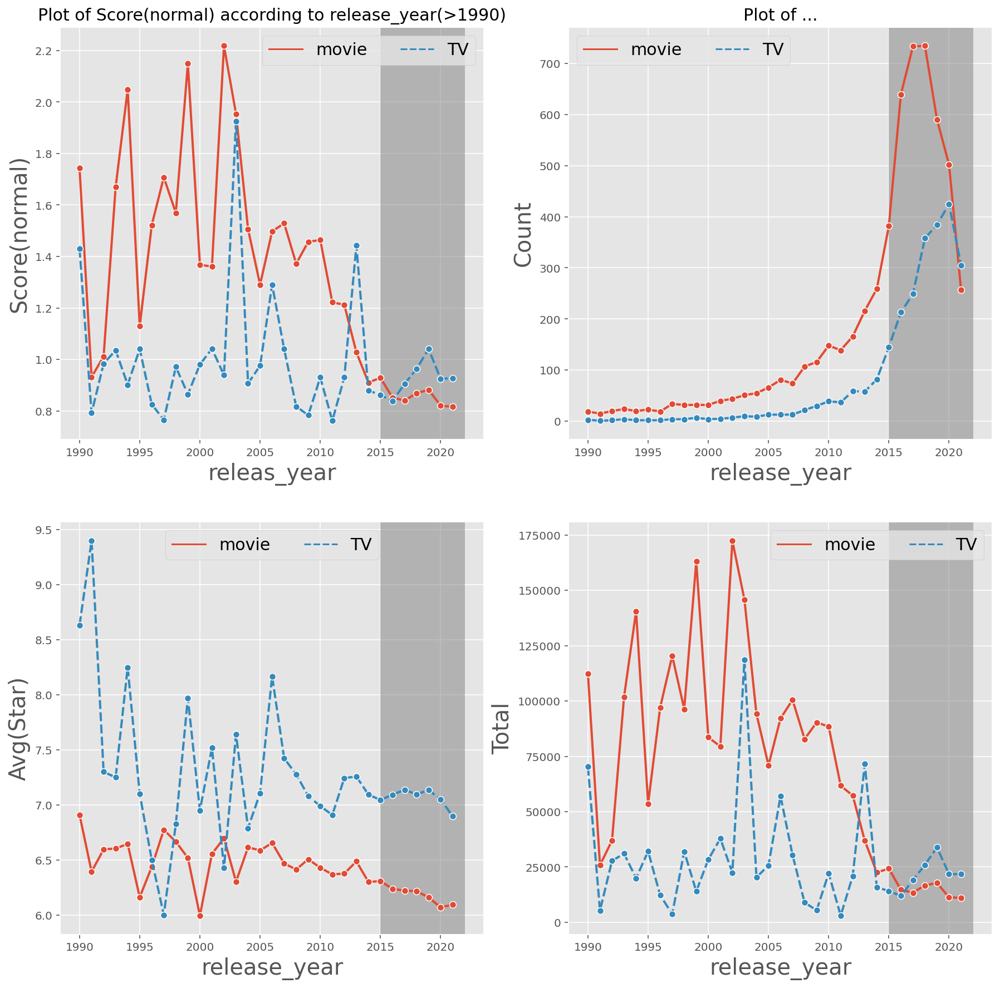

In [25]:
year_type_df = df.groupby(["type", "release_year"])["Score_normal"].mean().unstack().rename(index = {0:"movie", 1:"TV"})
year_type_cnt_df = df.groupby(["type", "release_year"])["Score_normal"].count().unstack().rename(index = {0:"movie", 1:"TV"})
year_type_avg_df = df.groupby(["type", "release_year"])["Avg"].mean().unstack().rename(index = {0:"movie", 1:"TV"})
year_type_total_df = df.groupby(["type", "release_year"])["Total"].mean().unstack().rename(index = {0:"movie", 1:"TV"})

# 90년대 이후 데이터로만
cols = [1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
year_type_df = year_type_df[cols]
year_type_cnt_df = year_type_cnt_df[cols]
year_type_avg_df = year_type_avg_df[cols]
year_type_total_df = year_type_total_df[cols]


plt.figure(figsize=(15,15))
# year_type_df.T.plot(marker = "o",figsize = (10,10))

plt.subplot(221)
sns.lineplot(data = year_type_df.T, marker = "o", linewidth=2)
plt.title("Plot of Score(normal) according to release_year(>1990)", fontsize= 15)
plt.legend(loc='best', ncol = 2, fontsize = 15, frameon=True)
plt.xlabel("releas_year",fontsize = 20)
plt.ylabel("Score(normal)" ,fontsize = 20)
plt.axvspan(2015, 2022, facecolor='gray', alpha = 0.5)


plt.subplot(222)
sns.lineplot(data=year_type_cnt_df.T, marker ="o", linewidth=2)
plt.legend(loc='best', ncol = 2, fontsize = 15, frameon=True)
plt.xlabel("release_year",fontsize = 20)
plt.ylabel("Count" ,fontsize = 20)
plt.title("Plot of ...", fontsize= 15)
plt.axvspan(2015, 2022, facecolor='gray', alpha = 0.5)

plt.subplot(223)
sns.lineplot(data = year_type_avg_df.T, marker = "o", linewidth=2)
plt.title("", fontsize= 15)
plt.legend(loc='best', ncol = 2, fontsize = 15, frameon=True)
plt.xlabel("release_year",fontsize = 20)
plt.ylabel("Avg(Star)" ,fontsize = 20)
plt.axvspan(2015, 2022, facecolor='gray', alpha = 0.5)

plt.subplot(224)
sns.lineplot(data = year_type_total_df.T, marker = "o", linewidth=2)
plt.title("", fontsize= 15)
plt.legend(loc='best', ncol = 2, fontsize = 15, frameon=True)
plt.xlabel("release_year",fontsize = 20)
plt.ylabel("Total" ,fontsize = 20)
plt.axvspan(2015, 2022, facecolor='gray', alpha = 0.5)

# 전반적인 부분에 대해서,..!!!
# add_dated,..

plt.show()

- 전체적으로 현대에 가까워 질 수록 영화보다는 TV Series의 Score가 높아지는 것을 볼 수 있습니다.
- 작품 수 또한 영화의 작품 수가 항상 TV Series보다 많은 것을 확인 할 수 있지만, 2020년에는 역전 된 것을 알 수 있습니다. 이는 TV는 시리즈 물이기 때문에 당연하게도 영화보다는 작품 수가 적는게 당연합니다.

In [26]:
genres = []
years = []
flg = len(genres)
for genre, year in zip(df[df["type"] == 0]["listed_in"], df[df["type"] == 0]["release_year"]):
    genres += genre
    c = len(genres) - flg
    flg = len(genres)
    years += [year] * c
    
gnre = []
for genre in genres:
    gnre.append(genre.strip())

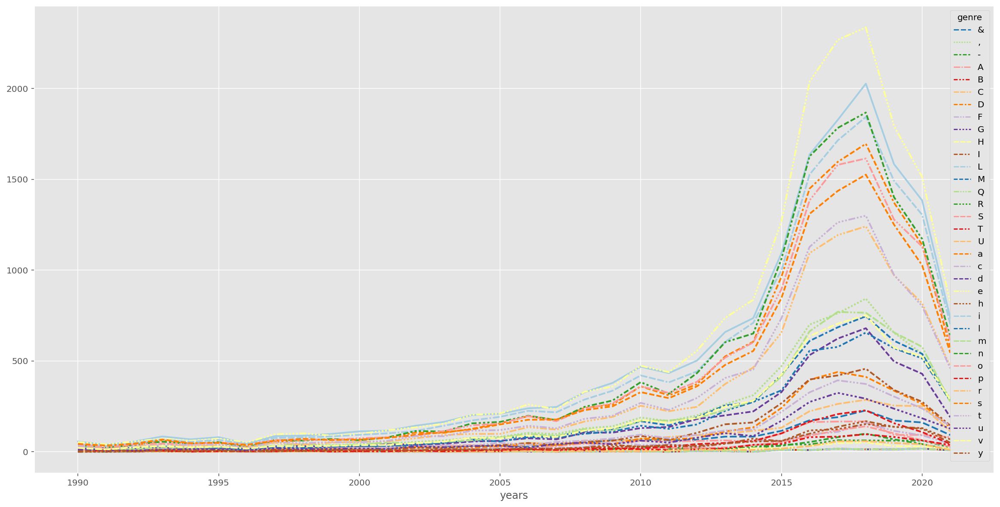

In [27]:
gnre_yrs_df = pd.DataFrame({"genre" :gnre, "years" : years })
gnre_yrs_df = gnre_yrs_df[gnre_yrs_df["years"] >= 1990]

gnre_yrs_df = gnre_yrs_df.groupby(["genre", "years"]).size().unstack()
# drop = ['Independent Movies', 'International Movies', 'Movies']
# gnre_yrs_df = gnre_yrs_df.drop(drop)

gnre_yrs_df = gnre_yrs_df.fillna(0)

plt.figure(figsize=(20,10))
sns.lineplot(data = gnre_yrs_df.T, palette= "Paired", linewidth = 2)
plt.show()

In [28]:
# 연도별 장르, 드라마

genres = []
years = []
flg = len(genres)
for genre, year in zip(df[df["type"] == 1]["listed_in"], df[df["type"] == 1]["release_year"]):
    genres += genre
    c = len(genres) - flg
    flg = len(genres)
    years += [year] * c
    
gnre = []
for genre in genres:
    gnre.append(genre.strip())

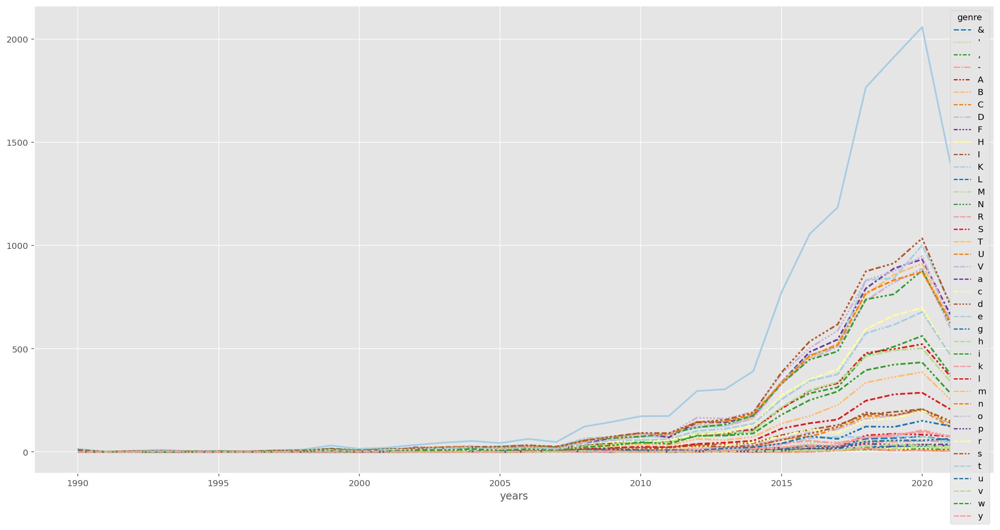

In [29]:
gnre_yrs_df = pd.DataFrame({"genre" :gnre, "years" : years })
gnre_yrs_df = gnre_yrs_df[gnre_yrs_df["years"] >= 1990]

gnre_yrs_df = gnre_yrs_df.groupby(["genre", "years"]).size().unstack()
# drop = ['International TV Shows']
# gnre_yrs_df = gnre_yrs_df.drop(drop)

gnre_yrs_df = gnre_yrs_df.fillna(0)

plt.figure(figsize=(20,10))
sns.lineplot(data = gnre_yrs_df.T, palette= "Paired", linewidth = 2)
plt.show()

In [30]:
# 연도별 시청등급
# 연도별 나라

In [ ]:
# 1. release, data_added 차이가 안나는 것들
# 2. 넷플릭스 original

In [156]:
def gnre_year(df: pd.DataFrame, year: str):
    genres = df[df["date_added_year"] == year]["listed_in"].tolist()
    add_datedes = df[df["date_added_year"] == year]["date_added_year"].tolist()

    gnres = []
    add_date = []
    flg = len(gnres)
    for gnre, add_dated in zip(genres, add_datedes):
        gnres += gnre.split(", ")

        c = len(gnres) - flg
        flg = len(gnres)
        for i in range(c):
            add_date.append(add_dated)

    df = pd.DataFrame({f"genre_{year}": gnres, "add_date": add_date})
    display(df.groupby(f"genre_{year}").count().sort_values(by="add_date", ascending=False).head(10).style.background_gradient('Reds'))

In [175]:
# 1. release, data_added 차이가 안나는 것들

df["diff"] = df["date_added_year"].astype(int) - df["release_year"]
df_diff_5 = df[df["diff"] >= 5]
df_diff_5 = df_diff_5.reset_index(drop=True)

In [160]:
gnre_year(df_diff_5 , "2016") # 2016, diff-5
gnre_year(df_diff_5 , "2017") # 2017, diff-5
gnre_year(df_diff_5 , "2018") # 2017, diff-5

,add_date
genre_2016,
Kids' TV,20
International TV Shows,17
TV Comedies,10
Docuseries,10
Romantic TV Shows,9
International Movies,8
Crime TV Shows,7
British TV Shows,6
TV Dramas,6


,add_date
genre_2017,
International Movies,70
Dramas,49
International TV Shows,45
TV Dramas,31
Comedies,29
Documentaries,27
Action & Adventure,21
Romantic TV Shows,17
Music & Musicals,15


,add_date
genre_2018,
International Movies,247
Dramas,175
Comedies,121
Action & Adventure,72
Music & Musicals,46
Romantic Movies,39
Children & Family Movies,34
Stand-Up Comedy,31
Independent Movies,31


In [161]:
gnre_year(df_diff_5 , "2019") # 2019, diff-5
gnre_year(df_diff_5 , "2020") # 2020, diff-5
gnre_year(df_diff_5 , "2021") # 2021, diff-5

,add_date
genre_2019,
Dramas,217
Comedies,189
International Movies,185
Action & Adventure,112
Romantic Movies,73
Independent Movies,63
Children & Family Movies,54
Thrillers,46
Classic Movies,44


,add_date
genre_2020,
Comedies,196
International Movies,188
Dramas,184
Action & Adventure,84
Romantic Movies,66
Children & Family Movies,56
Independent Movies,42
Thrillers,36
Horror Movies,35


,add_date
genre_2021,
Dramas,176
Comedies,162
Action & Adventure,130
International Movies,123
Romantic Movies,58
Thrillers,45
Children & Family Movies,45
Independent Movies,44
Sci-Fi & Fantasy,32


In [ ]:
# NETFLIX OG

df_OG = df[df["Original"] == 1]

In [162]:
gnre_year(df_OG , "2016") # 2016, NETFLIX OG
gnre_year(df_OG , "2017") # 2017, NETFLIX OG
gnre_year(df_OG , "2018") # 2017, NETFLIX OG

,add_date
genre_2016,
Documentaries,11
Dramas,8
Comedies,7
International Movies,6
Action & Adventure,4
Thrillers,4
Independent Movies,3
Music & Musicals,2
Sci-Fi & Fantasy,2


,add_date
genre_2017,
Dramas,22
Documentaries,16
Comedies,15
Independent Movies,13
Romantic Movies,8
Thrillers,7
Horror Movies,5
Action & Adventure,4
Children & Family Movies,3


,add_date
genre_2018,
Dramas,36
Comedies,25
Documentaries,18
International Movies,15
Independent Movies,12
Thrillers,11
Romantic Movies,10
Action & Adventure,9
Music & Musicals,8


In [163]:
gnre_year(df_OG , "2019") # 2016, NETFLIX OG
gnre_year(df_OG , "2020") # 2017, NETFLIX OG
gnre_year(df_OG , "2021") # 2017, NETFLIX OG

,add_date
genre_2019,
Dramas,44
Documentaries,32
Comedies,31
International Movies,27
Independent Movies,14
Music & Musicals,13
Children & Family Movies,11
Romantic Movies,11
Thrillers,11


,add_date
genre_2020,
International Movies,75
Dramas,54
Comedies,50
Documentaries,34
Children & Family Movies,23
Romantic Movies,23
Thrillers,20
Action & Adventure,15
Independent Movies,13


,add_date
genre_2021,
International Movies,37
Dramas,33
Comedies,16
Documentaries,11
Thrillers,9
Action & Adventure,8
Romantic Movies,7
Children & Family Movies,5
Independent Movies,5
